In [1]:
!pip install pandas spacy tensorflow imbalanced-learn

In [2]:
!python -m spacy download en_core_web_sm

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.8/12.8 MB 90.5 MB/s eta 0:00:00
✔ Download and installation successful
You can now load the package via spacy.load('en_core_web_sm')
⚠ Restart to reload dependencies
If you are in a Jupyter or Colab notebook, you may need to restart Python in
order to load all the package's dependencies. You can do this by selecting the
'Restart kernel' or 'Restart runtime' option.


In [3]:
#import libraries
import pandas as pd
import spacy
from tensorflow.keras.preprocessing.text import one_hot
from tensorflow.keras.preprocessing.sequence import pad_sequences
import numpy as np
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
import tensorflow as tf
from tensorflow import keras
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns

In [4]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [5]:
df = pd.read_csv('/content/drive/MyDrive/dataset_new/manual/spelling_correct_with_removeNumber - spelling_correct_with_removeNumber.csv')

In [6]:
df

,sentence,labels
0,in going to go,0
1,in going to say goodby to the drugstore,0
2,i think that this is the way it should be done...,0
3,in going to join you,0
4,its illegal,0
...,...,...
25565,i saw that there are people like musfakur him ...,0
25566,papa she is trying to avoid responsibility here,0
25567,said needs the bangladesh team,0
25568,you keep going we ll take your shot,0


In [7]:
#check null values
df.isna().sum()

,0
sentence,0
labels,0


In [8]:
import nltk
nltk.download('stopwords')
from nltk.corpus import stopwords

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


In [9]:
def remove_stopwords(text):
  new_text = []

  for word in text.split():
    if word in stopwords.words('english'):
      new_text.append('')
    else:
      new_text.append(word)
  x = new_text[:]
  new_text.clear()
  return " ".join(x)

In [10]:
df['sentence']=df['sentence'].apply(remove_stopwords)
df

,sentence,labels
0,going go,0
1,going say goodby drugstore,0
2,think way done bal system time dom...,0
3,going join,0
4,illegal,0
...,...,...
25565,saw people like musfakur wandering us ...,0
25566,papa trying avoid responsibility,0
25567,said needs bangladesh team,0
25568,keep going take shot,0


In [11]:
import spacy
nlp = spacy.load('en_core_web_sm')

In [12]:
def tokenize_text(text):
    doc = nlp(text)
    # Create a list of tokens, excluding punctuation and whitespace
    return [token.text for token in doc if not token.is_punct and not token.is_space]

In [13]:
df['sentence'] = df['sentence'].apply(tokenize_text)
df

,sentence,labels
0,"[going, go]",0
1,"[going, say, goodby, drugstore]",0
2,"[think, way, done, bal, system, time, domestic...",0
3,"[going, join]",0
4,[illegal],0
...,...,...
25565,"[saw, people, like, musfakur, wandering, us, b...",0
25566,"[papa, trying, avoid, responsibility]",0
25567,"[said, needs, bangladesh, team]",0
25568,"[keep, going, take, shot]",0


In [14]:
import nltk
nltk.download('punkt')
from nltk.stem.porter import PorterStemmer

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


In [15]:
ps = PorterStemmer()

In [16]:
def stem_words(text):
    if isinstance(text, str):
        return " ".join([ps.stem(word) for word in text.split()])
    else:
        return text

In [17]:
df['sentence'] = df['sentence'].apply(stem_words)
df

,sentence,labels
0,"[going, go]",0
1,"[going, say, goodby, drugstore]",0
2,"[think, way, done, bal, system, time, domestic...",0
3,"[going, join]",0
4,[illegal],0
...,...,...
25565,"[saw, people, like, musfakur, wandering, us, b...",0
25566,"[papa, trying, avoid, responsibility]",0
25567,"[said, needs, bangladesh, team]",0
25568,"[keep, going, take, shot]",0


one-hot representation

In [18]:
vocab_size = 20000
one_hot_representation = [one_hot(str(words), vocab_size) for words in df['sentence']]

In [19]:
for i in range(0, 4):
  print(df['sentence'].iloc[i])

['going', 'go']
['going', 'say', 'goodby', 'drugstore']
['think', 'way', 'done', 'bal', 'system', 'time', 'domestic', 'players', 'got', 'opportunities', 'play', 'ever']
['going', 'join']


In [20]:
for i in range(0, 4):
  print(one_hot_representation[i])

[12601, 5679]
[12601, 8761, 14800, 12549]
[7997, 12158, 15420, 3403, 15018, 8842, 6870, 8514, 7257, 15916, 8154, 17298]
[12601, 11187]


In [21]:
sentence_length = 50
embedded_tweet = pad_sequences(one_hot_representation, padding = 'pre' , maxlen = sentence_length )

In [22]:
for i in range(0, 4):
  print(embedded_tweet[i])

[    0     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0     0     0     0     0     0     0     0     0
 12601  5679]
[    0     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0     0     0     0     0     0     0 12601  8761
 14800 12549]
[    0     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0     0     0     0     0     0     0     0     0
     0     0  7997 12158 15420  3403 15018  8842  6870  8514  7257 15916
  8154 17298]
[    0     0     0     0     0     0     0     0     0     0     0     0
     0   

In [23]:
x = np.array(embedded_tweet)
y = np.array(df['labels'])

In [24]:
df['labels'].value_counts()

,count
labels,
1,14565
0,11005


In [25]:
smote = SMOTE(sampling_strategy='minority')
x, y = smote.fit_resample(x, y)

df['labels'].value_counts()

,count
labels,
1,14565
0,11005


In [26]:
# train- test - split
from sklearn.model_selection import train_test_split

# Assuming 'x' and 'y' are your features and target variable respectively
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=42)

# Further split the training data into training and validation sets
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.3, random_state=42)
# 20% of the training data is used for validation

creating model

In [27]:
dimension = 50

model = keras.Sequential([
    #embedding layer
    keras.layers.Embedding(vocab_size, dimension, input_length = sentence_length),
    #LSTM Layer
    keras.layers.LSTM(100, return_sequences=True),
    keras.layers.LSTM(50, return_sequences=True),
    keras.layers.LSTM(50),
    #output layer
    keras.layers.Dense(2, activation = 'softmax')
])
model.compile(optimizer = 'adam',
              loss = 'sparse_categorical_crossentropy',
              metrics = ['accuracy']
              )

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


In [28]:
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ embedding (Embedding)                │ ?                           │     0 (unbuilt) │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm (LSTM)                          │ ?                           │     0 (unbuilt) │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_1 (LSTM)                        │ ?                           │     0 (unbuilt) │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_2 (LSTM)                        │ ?                           │     0 (unbuilt) │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ ?                           │     0 (unbuilt) │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 0 (0.00 B)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 0 (0.00 B)

In [29]:
history = model.fit(X_train, y_train,
                    epochs=10,
                    batch_size=32,
                    validation_data=(X_val, y_val))

Epoch 1/10
447/447 ━━━━━━━━━━━━━━━━━━━━ 13s 15ms/step - accuracy: 0.7268 - loss: 0.4897 - val_accuracy: 0.8830 - val_loss: 0.2986
Epoch 2/10
447/447 ━━━━━━━━━━━━━━━━━━━━ 6s 12ms/step - accuracy: 0.9213 - loss: 0.2100 - val_accuracy: 0.8807 - val_loss: 0.3109
Epoch 3/10
447/447 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - accuracy: 0.9501 - loss: 0.1385 - val_accuracy: 0.8496 - val_loss: 0.4383
Epoch 4/10
447/447 ━━━━━━━━━━━━━━━━━━━━ 14s 14ms/step - accuracy: 0.9660 - loss: 0.0982 - val_accuracy: 0.8482 - val_loss: 0.4471
Epoch 5/10
447/447 ━━━━━━━━━━━━━━━━━━━━ 9s 12ms/step - accuracy: 0.9768 - loss: 0.0677 - val_accuracy: 0.8341 - val_loss: 0.6164
Epoch 6/10
447/447 ━━━━━━━━━━━━━━━━━━━━ 10s 12ms/step - accuracy: 0.9842 - loss: 0.0484 - val_accuracy: 0.8297 - val_loss: 0.6307
Epoch 7/10
447/447 ━━━━━━━━━━━━━━━━━━━━ 11s 13ms/step - accuracy: 0.9872 - loss: 0.0435 - val_accuracy: 0.8156 - val_loss: 0.7322
Epoch 8/10
447/447 ━━━━━━━━━━━━━━━━━━━━ 11s 15ms/step - accuracy: 0.9863 - loss: 0.0450 - va

In [30]:
loss, accuracy = model.evaluate(X_test, y_test)
print(f'Model Accuracy : {accuracy * 100}')

274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.8284 - loss: 0.7531
Model Accuracy : 82.24053382873535


In [31]:
pred = np.argmax(model.predict(X_test), axis = -1)

274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step


In [32]:
print(classification_report(y_test, pred))

              precision    recall  f1-score   support

           0       0.82      0.83      0.83      4435
           1       0.82      0.81      0.82      4304

    accuracy                           0.82      8739
   macro avg       0.82      0.82      0.82      8739
weighted avg       0.82      0.82      0.82      8739



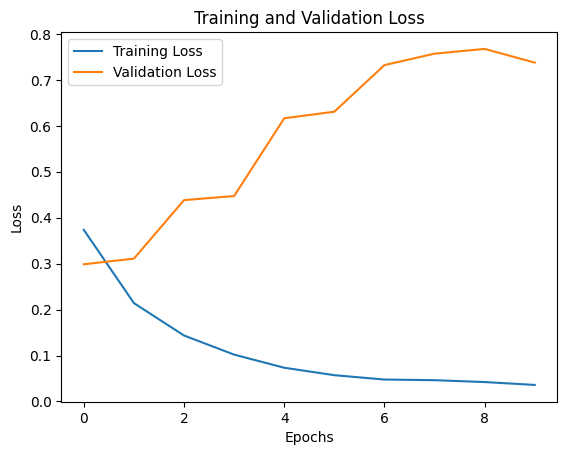

In [33]:
import matplotlib.pyplot as plt

# Extract the loss values
train_loss = history.history['loss']        # Training loss
val_loss = history.history['val_loss']      # Validation loss

# Plot both losses
plt.plot(train_loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.8284 - loss: 0.7531
Test Accuracy: 82.24%


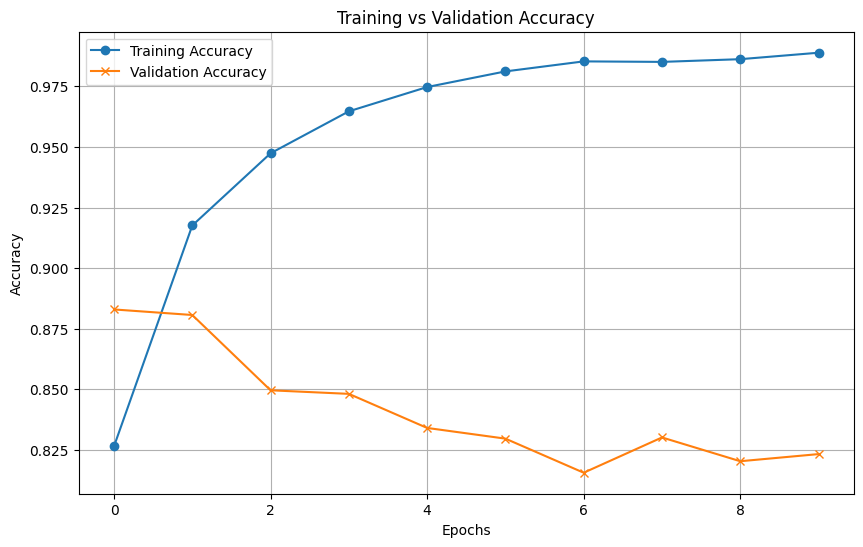

In [34]:


# Evaluate the model on the test set
loss, accuracy = model.evaluate(X_test, y_test)
print(f"Test Accuracy: {accuracy * 100:.2f}%")

# Access training and validation accuracies
train_acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

# Plot training and validation accuracy over epochs
plt.figure(figsize=(10, 6))
plt.plot(train_acc, label='Training Accuracy', marker='o')
plt.plot(val_acc, label='Validation Accuracy', marker='x')
plt.title('Training vs Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.grid()
plt.show()


In [35]:
# Get predictions on the test set
y_pred_prob = model.predict(X_test)

# Convert predicted probabilities to class labels
y_pred = y_pred_prob.argmax(axis=1)  # Since you're using softmax, we take the argmax to get class labels

274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


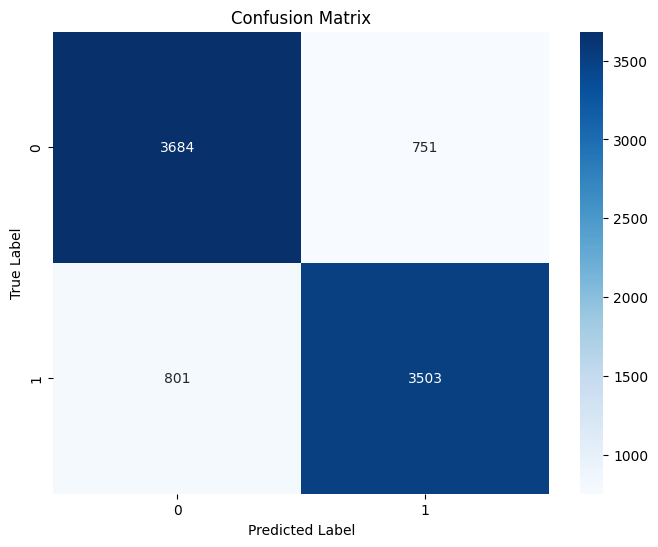

In [36]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Compute the confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)

# Plot the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=[0, 1], yticklabels=[0, 1])
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix')
plt.show()


In [37]:
from sklearn.preprocessing import label_binarize

# One-hot encode the true labels
y_test_onehot = label_binarize(y_test, classes=[0, 1])  # Adjust based on your number of classes


In [38]:
# Get predicted probabilities for the test set
y_pred_prob = model.predict(X_test)  # This returns the softmax probabilities for each class


274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


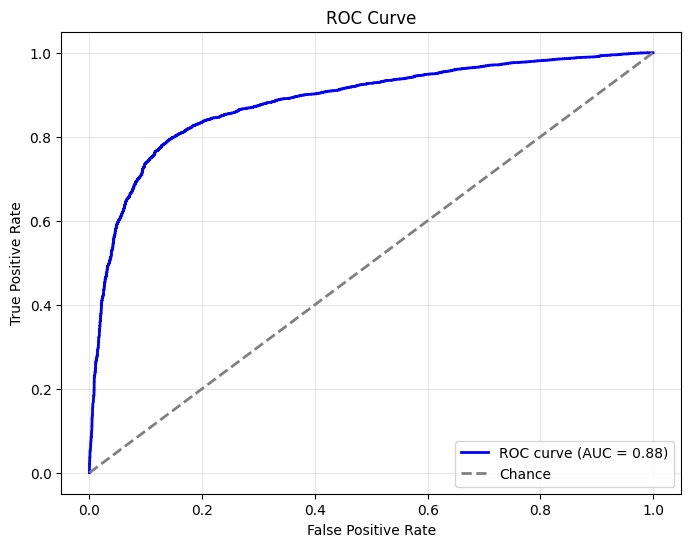

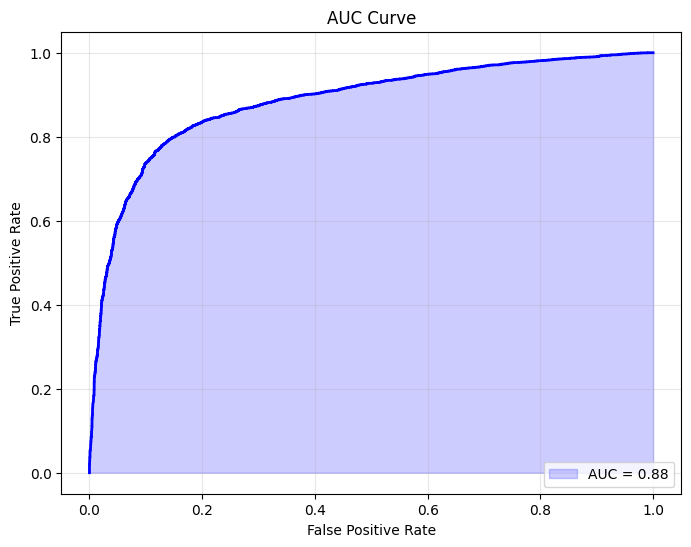

In [39]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc, classification_report
import numpy as np

# Assuming 'y_test' is in categorical format (e.g., [0, 1] or [1, 0])
# Convert y_test back to numeric format if necessary
if len(y_test.shape) > 1 and y_test.shape[1] == 2:
    y_test_numeric = np.argmax(y_test, axis=1)  # Convert one-hot to single-label
else:
    y_test_numeric = y_test

# Get predicted probabilities
y_pred_proba = model.predict(X_test)

# Calculate ROC curve and AUC for each class
fpr, tpr, _ = roc_curve(y_test_numeric, y_pred_proba[:, 1])  # Use probabilities of the positive class
roc_auc = auc(fpr, tpr)

# Plot the ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--', label='Chance')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend(loc='lower right')
plt.grid(alpha=0.3)
plt.show()

# Plot the AUC curve separately
plt.figure(figsize=(8, 6))
plt.fill_between(fpr, tpr, color='blue', alpha=0.2, label=f'AUC = {roc_auc:.2f}')
plt.plot(fpr, tpr, color='blue', lw=2)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('AUC Curve')
plt.legend(loc='lower right')
plt.grid(alpha=0.3)
plt.show()



In [40]:
pip install lime


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 9.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=76a18e5dd65c5374e6c9f154d2ee108077353e4186cf7e0c64d53c8d0923edf2
  Stored in directory: /root/.cache/pip/wheels/fd/a2/af/9ac0a1a85a27f314a06b39e1f492bee1547d52549a4606ed89
Successfully built lime


In [41]:
from tensorflow.keras.preprocessing.text import Tokenizer

# Example setup - be sure to use the same vocabulary size as during training
tokenizer = Tokenizer(num_words=vocab_size, oov_token="<OOV>")

# Assuming X_train is a NumPy array containing numerical data or preprocessed text
# Convert X_train to a list of strings
X_train_texts = [str(text) for text in X_train]  # Convert each item to a string if necessary

# Now fit on the string data
tokenizer.fit_on_texts(X_train_texts)  # Fit on training data

In [42]:
import numpy as np
import lime
from lime.lime_text import LimeTextExplainer
from tensorflow.keras.preprocessing.sequence import pad_sequences

# Assuming you have a tokenizer, model, and necessary data variables
# Define the prediction function for LIME
def predict_proba(texts):
    # Tokenize and pad the texts
    sequences = tokenizer.texts_to_sequences(texts)  # Assuming you have a tokenizer
    padded_sequences = pad_sequences(sequences, maxlen=sentence_length, padding='post')

    # Get model predictions
    probs = model.predict(padded_sequences)
    return probs

# Initialize LIME for text
explainer = LimeTextExplainer(class_names=['Not Hate Speech', 'Hate Speech'])

# Input: Enter 10 sentences at once
print("Enter 10 sentences separated by a new line:")
sample_texts = []
for _ in range(10):
    sample_texts.append(input())

# Generate explanations for each sentence
explanations = []
for i, sample_text in enumerate(sample_texts):
    print(f"\nGenerating explanation for sentence {i + 1}: {sample_text}")
    exp = explainer.explain_instance(sample_text, predict_proba, num_features=5)
    explanations.append((sample_text, exp))

# Display all explanations together
for i, (text, exp) in enumerate(explanations):
    print(f"\nExplanation for sentence {i + 1}: {text}")
    exp.show_in_notebook(text=text)


Enter 10 sentences separated by a new line:
i kill you
you are a son of bitch
mother fucker people
you are a whore
my fucking bad ass
beautiful scenery
i think i like her
bastard people
bloody illiterate
i hate you

Generating explanation for sentence 1: i kill you
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step

Generating explanation for sentence 2: you are a son of bitch
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step

Generating explanation for sentence 3: mother fucker people
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step

Generating explanation for sentence 4: you are a whore
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step

Generating explanation for sentence 5: my fucking bad ass
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step

Generating explanation for sentence 6: beautiful scenery
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step

Generating explanation for sentence 7: i think i like her
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step

Generating explanation for sentence 8: bastard people
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/


Explanation for sentence 2: you are a son of bitch



Explanation for sentence 3: mother fucker people



Explanation for sentence 4: you are a whore



Explanation for sentence 5: my fucking bad ass



Explanation for sentence 6: beautiful scenery



Explanation for sentence 7: i think i like her



Explanation for sentence 8: bastard people



Explanation for sentence 9: bloody illiterate



Explanation for sentence 10: i hate you
